<a href="https://colab.research.google.com/github/GuilleAnderson/Binary-Classification/blob/main/Classification_Tree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


:)

# Predicting Heart Disease

In [ ]:
import numpy as np
import pandas as pd
import os
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

In [ ]:
pd.set_option('display.max_rows', 500)
pd.options.display.float_format = '{:,.2f}'.format

In [ ]:
path = os.path.dirname(os.path.abspath('0423_SupML_Guillermo_Anderson.ipynb'))
os.chdir(path)

In [ ]:
df = pd.read_csv('heart_disease_data.csv', sep =',')

In [ ]:
data_dix = pd.read_csv('data_dictionary.csv', sep = ';')

In [ ]:
df.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer', 'HeartDisease_FamilyHistory',
       'State'],
      dtype='object')

In [ ]:
df.head().T

,0,1,2,3,4
HeartDisease,No,No,No,No,No
BMI,16.60,20.34,26.58,24.21,23.71
Smoking,Yes,No,Yes,No,No
AlcoholDrinking,No,NaN,NaN,NaN,No
Stroke,No,Yes,No,No,No
PhysicalHealth,3.00,0.00,20.00,0.00,28.00
MentalHealth,30.00,0.00,30.00,0.00,0.00
DiffWalking,No,No,No,No,Yes
Sex,Female,Female,Male,Female,Female
AgeCategory,55-59,80 or older,65-69,75-79,40-44


In [ ]:
data_dix

,Variable,Explanation,Unnamed: 2
0,HeartDisease,Respondents that have ever reported having cor...,NaN
1,BMI,Body Mass Index (BMI),NaN
2,Smoking,Have you smoked at least 100 cigarettes in you...,NaN
3,AlcoholDrinking,Heavy drinkers (adult men having more than 14 ...,NaN
4,Stroke,(Ever told) (you had) a stroke?,NaN
5,PhysicalHealth,"Now thinking about your physical health, which...",NaN
6,MentalHealth,"Thinking about your mental health, for how man...",NaN
7,DiffWalking,Do you have serious difficulty walking or clim...,NaN
8,Sex,Are you male or female?,NaN
9,AgeCategory,Fourteen-level age category,NaN


In [ ]:
df.sample(10).T

,84254,148893,393,77079,61869,169542,262026,252366,96196,255697
HeartDisease,No,No,No,No,No,Yes,No,No,No,No
BMI,21.97,28.87,22.53,19.49,24.69,33.66,29.05,28.06,24.81,22.71
Smoking,No,Yes,No,No,No,No,No,No,Yes,No
AlcoholDrinking,NaN,NaN,NaN,No,No,No,NaN,No,NaN,Yes
Stroke,No,No,No,No,No,No,No,No,No,No
PhysicalHealth,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MentalHealth,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,30.00
DiffWalking,No,No,No,No,No,No,No,Yes,No,No
Sex,Female,Female,Male,Female,Female,Female,Female,Female,Male,Female
AgeCategory,25-29,55-59,70-74,65-69,80 or older,70-74,60-64,80 or older,30-34,60-64


In [ ]:
df.shape

(319795, 20)

In [ ]:
heart_disease = df[(df['HeartDisease'] == 'Yes')]


### Numerical Variables

In [ ]:
df.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,"319,795.00","319,795.00","319,795.00","319,795.00"
mean,28.33,3.37,3.90,7.10
std,6.37,7.95,7.96,1.44
min,12.02,0.00,0.00,1.00
25%,24.03,0.00,0.00,6.00
50%,27.34,0.00,0.00,7.00
75%,31.44,2.00,3.00,8.00
max,119.00,30.00,30.00,24.00


Since it was specified that every row is an individual patient, I don't need to add an unique identifier and rely solely on the index number.

### Categorical vairables

In [ ]:
df.describe(exclude = np.number).T

,count,unique,top,freq
HeartDisease,319795,2,No,292422
Smoking,319795,2,No,187887
AlcoholDrinking,212984,2,No,191207
Stroke,318683,2,No,306614
DiffWalking,319795,2,No,275385
Sex,319795,2,Female,167805
AgeCategory,319795,14,65-69,34143
Race,319795,6,White,245212
Diabetic,319795,4,No,269653
PhysicalActivity,319795,2,Yes,247957


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 20 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   HeartDisease                319795 non-null  object 
 1   BMI                         319795 non-null  float64
 2   Smoking                     319795 non-null  object 
 3   AlcoholDrinking             212984 non-null  object 
 4   Stroke                      318683 non-null  object 
 5   PhysicalHealth              319795 non-null  float64
 6   MentalHealth                319795 non-null  float64
 7   DiffWalking                 319795 non-null  object 
 8   Sex                         319795 non-null  object 
 9   AgeCategory                 319795 non-null  object 
 10  Race                        319795 non-null  object 
 11  Diabetic                    319795 non-null  object 
 12  PhysicalActivity            319795 non-null  object 
 13  GenHealth     

### Null Values

In [ ]:
df.isna().sum()

HeartDisease                       0
BMI                                0
Smoking                            0
AlcoholDrinking               106811
Stroke                          1112
PhysicalHealth                     0
MentalHealth                       0
DiffWalking                        0
Sex                                0
AgeCategory                        0
Race                               0
Diabetic                           0
PhysicalActivity                   0
GenHealth                          0
SleepTime                          0
Asthma                             0
KidneyDisease                      0
SkinCancer                       349
HeartDisease_FamilyHistory    284532
State                              0
dtype: int64

There are many null values in both Alcohol Drinking, and Heart Disease.  Family History. I am going to assess whether to kill these variables

In [ ]:
print("Alcohol NaN's represent:", 100*df.isna().sum()[3]/df.shape[0], "% of the available data")
print("Family History NaN's represent:", 100*df.isna().sum()[-2]/df.shape[0], "% of the data")

Alcohol NaN's represent: 33.39983426882847 % of the available data
Family History NaN's represent: 88.97324848731219 % of the data


In [ ]:
df['HeartDisease_FamilyHistory'].value_counts()

HeartDisease_FamilyHistory
No     32008
Yes     3255
Name: count, dtype: int64

In [ ]:
df_target = df[df['HeartDisease']=='Yes']

df_target['HeartDisease_FamilyHistory'].value_counts()

HeartDisease_FamilyHistory
No     2648
Yes     289
Name: count, dtype: int64

In [ ]:
print("Heart disease in the family is present on", 100*df_target['HeartDisease_FamilyHistory'].value_counts()[1]/df_target.shape[0], '% of the samples')

Heart disease in the family is present on 1.0557848975267599 % of the samples


Given the exaggerated amount of NaN's in Family History (88.9% of the data), and how the Heart Disease  are present in 1.055 % of the affected's Families' histories, I am going to erase this problematic column

I am taking into consideration that this might be a very good explainatory variable, however, this much missing Boolean data makes it beyond my current abilities to tackle this variable

In [ ]:
df.drop(columns = "HeartDisease_FamilyHistory", inplace = True)

In [ ]:
df.isna().sum()

HeartDisease             0
BMI                      0
Smoking                  0
AlcoholDrinking     106811
Stroke                1112
PhysicalHealth           0
MentalHealth             0
DiffWalking              0
Sex                      0
AgeCategory              0
Race                     0
Diabetic                 0
PhysicalActivity         0
GenHealth                0
SleepTime                0
Asthma                   0
KidneyDisease            0
SkinCancer             349
State                    0
dtype: int64

In [ ]:
df.groupby('HeartDisease')['AlcoholDrinking'].describe()

,count,unique,top,freq
HeartDisease,,,,
No,194979,2,No,174343
Yes,18005,2,No,16864


In [ ]:
np.unique(df[df['AlcoholDrinking'].isna()]['HeartDisease'], return_counts = True)

(array(['No', 'Yes'], dtype=object), array([97443,  9368], dtype=int64))

Alcohol drinking NaN are not as large as heart disease in the family. Additionally there is a big chunk of it that might explain heart disease as around 10% of the missing values for Alcohol Drinking, had heart disease. That's larger than the amount of Heart Disease in the whole data

In [ ]:
df.AlcoholDrinking.fillna(value = "NoData", inplace = True)

In [ ]:
df.groupby('HeartDisease')['SkinCancer'].describe()

,count,unique,top,freq
HeartDisease,,,,
No,292105,2,No,267266
Yes,27341,2,No,22361


In [ ]:
np.unique(df[df['SkinCancer'].isna()]['HeartDisease'], return_counts = True)

(array(['No', 'Yes'], dtype=object), array([317,  32], dtype=int64))

Only 32 cases of Heart Disease are present from the Skin Cancer. Will do the same as above

In [ ]:
df.SkinCancer.fillna(value = "NoData", inplace = True)

In [ ]:
df.Stroke.fillna(value = 'NoData', inplace = True)

### Other variables, observing and pre-treatment

In [ ]:
px.bar(df.groupby('Sex')["HeartDisease"].count())

In [ ]:
# Dicchotomical data (i.e boolean like)
df_yn = df.select_dtypes(include = ['object'])

In [ ]:
np.unique(df_yn['HeartDisease'])

array(['No', 'Yes'], dtype=object)

In [ ]:
df_yn = df_yn[df_yn['HeartDisease'] == 'Yes']

In [ ]:
df_yn.drop(columns = ['State','AgeCategory','GenHealth'], inplace = True)

In [ ]:
print(df_yn.shape)
df_yn.columns

(27373, 12)


Index(['HeartDisease', 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking',
       'Sex', 'Race', 'Diabetic', 'PhysicalActivity', 'Asthma',
       'KidneyDisease', 'SkinCancer'],
      dtype='object')

In [ ]:
df_yn.groupby("Smoking")['HeartDisease'].count()

Smoking
No     11336
Yes    16037
Name: HeartDisease, dtype: int64

Listen, I wanted to make these plots in a really elegant way, but I had difficulties picturing how to increase axs[x,y]'s values with every iteration. It was not worth the time, so my seond option is to plot all these veriables less elegantlty defining a function.

Text(0.5, 1.0, 'SkinCancer')

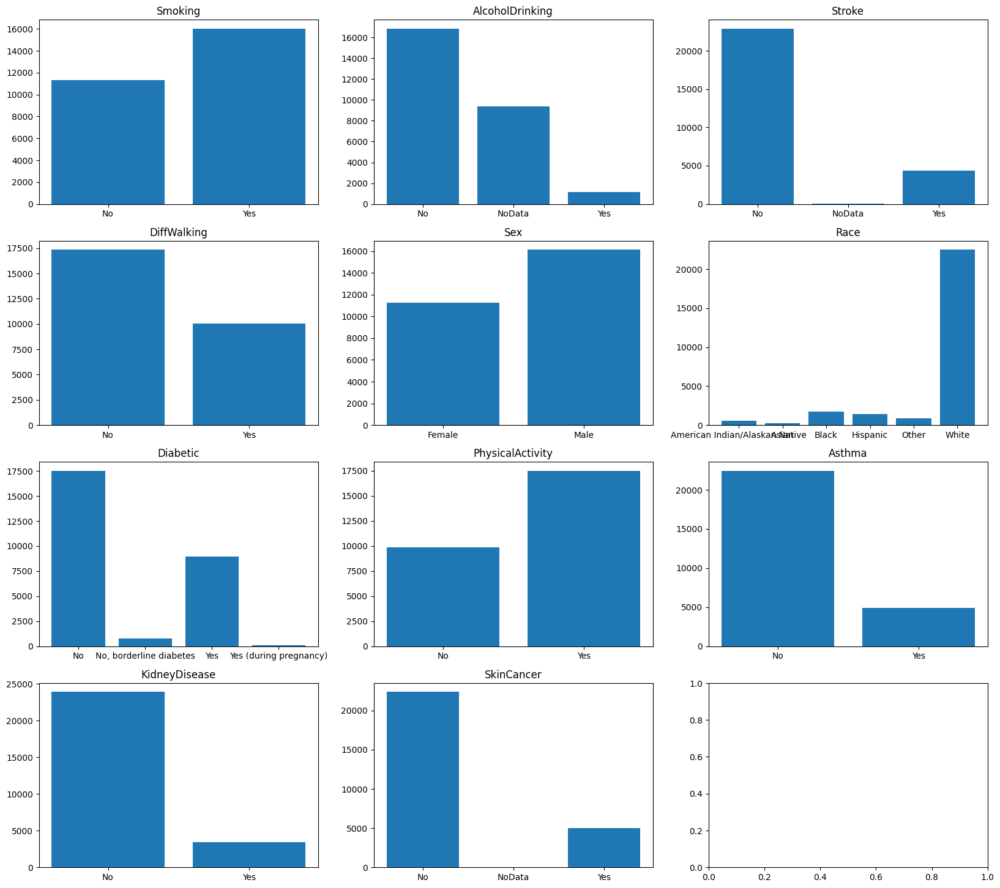

In [ ]:
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs[0, 0].bar(df_yn.groupby("Smoking")["HeartDisease"].count().index, df_yn.groupby("Smoking")["HeartDisease"].count().values)
axs[0, 0].set_title('Smoking')
axs[0, 1].bar(df_yn.groupby("AlcoholDrinking")["HeartDisease"].count().index, df_yn.groupby("AlcoholDrinking")["HeartDisease"].count().values)
axs[0, 1].set_title('AlcoholDrinking')
axs[0, 2].bar(df_yn.groupby("Stroke")["HeartDisease"].count().index, df_yn.groupby("Stroke")["HeartDisease"].count().values)
axs[0, 2].set_title('Stroke')


axs[1, 0].bar(df_yn.groupby("DiffWalking")["HeartDisease"].count().index, df_yn.groupby("DiffWalking")["HeartDisease"].count().values)
axs[1, 0].set_title('DiffWalking')
axs[1, 1].bar(df_yn.groupby("Sex")["HeartDisease"].count().index, df_yn.groupby("Sex")["HeartDisease"].count().values)
axs[1, 1].set_title('Sex')
axs[1, 2].bar(df_yn.groupby("Race")["HeartDisease"].count().index, df_yn.groupby("Race")["HeartDisease"].count().values)
axs[1, 2].set_title('Race')

axs[2, 0].bar(df_yn.groupby("Diabetic")["HeartDisease"].count().index, df_yn.groupby("Diabetic")["HeartDisease"].count().values)
axs[2, 0].set_title('Diabetic')
axs[2, 1].bar(df_yn.groupby("PhysicalActivity")["HeartDisease"].count().index, df_yn.groupby("PhysicalActivity")["HeartDisease"].count().values)
axs[2, 1].set_title('PhysicalActivity')
axs[2, 2].bar(df_yn.groupby("Asthma")["HeartDisease"].count().index, df_yn.groupby("Asthma")["HeartDisease"].count().values)
axs[2, 2].set_title('Asthma')

axs[3, 0].bar(df_yn.groupby("KidneyDisease")["HeartDisease"].count().index, df_yn.groupby("KidneyDisease")["HeartDisease"].count().values)
axs[3, 0].set_title('KidneyDisease')
axs[3, 1].bar(df_yn.groupby("SkinCancer")["HeartDisease"].count().index, df_yn.groupby("SkinCancer")["HeartDisease"].count().values)
axs[3, 1].set_title('SkinCancer')
#axs[3, 2].bar(df_yn.groupby("Asthma")["HeartDisease"].count().index, df_yn.groupby("Asthma")["HeartDisease"].count().values)
#axs[3, 2].set_title('Asthma')

At first sight,
* Smoking, and being Diabetic are the strongest risk factors here, however not being Diabetic does not eliminate the risk of having heart disease.
* We cannot draw any real conclusion from those people that answered "NO" on these variables, i.e. "AHHH so having Kidney Disease indicates that there is a low chance of heart disease" - NO, it actually suggests like kidney disease are not related to heart disease and/or kidney disease are quite rare.
* Even though more men had heart disease, it does not seem very unbalanced between sexes.
* Being white seems to be a risk factor, however genetics or race may not directly indicate heart disease, it may be that there are just more white people being sampled, or that minorities do not have as much medical access
* Very disturbingly, people with active Physical Activity are 50% more likely to have a stroke if Physical Activity were the ONLY factor...
* Interestingly, Alcohol and Asthma do not appear to be leading causes for Heart Disease

All these observations have to be taken lightly, because there have to be synergistic effects that either increase or decrease the risk of haveng heart disease

Now non dichotomical data

In [ ]:
df.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer', 'State'],
      dtype='object')

In [ ]:
px.histogram(df[df['HeartDisease']=='No'], x='BMI', color = 'HeartDisease', opacity = 0.5, title = "BMI and Heart Disease")

In [ ]:
px.histogram(df[df['HeartDisease']=='Yes'], x='BMI', title = 'BMI and Heart disease, HD = Yes')

At first glance, both distributions of BMI behave similarly, with a mean value between 24 - 26 and a very similar variance. Surprisingly it does not seem to play a role, even though it is common to hear that obese people have a greater risk

In [ ]:
df.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer', 'State'],
      dtype='object')

In [ ]:
np.unique(df.GenHealth)

array(['Excellent', 'Fair', 'Good', 'Poor', 'Very good'], dtype=object)

In [ ]:
df['GenHealth'].value_counts()

GenHealth
Very good    113858
Good          93129
Excellent     66842
Fair          34677
Poor          11289
Name: count, dtype: int64

Text(0.5, 1.0, 'AlcoholDrinking - Heart Disease NO')

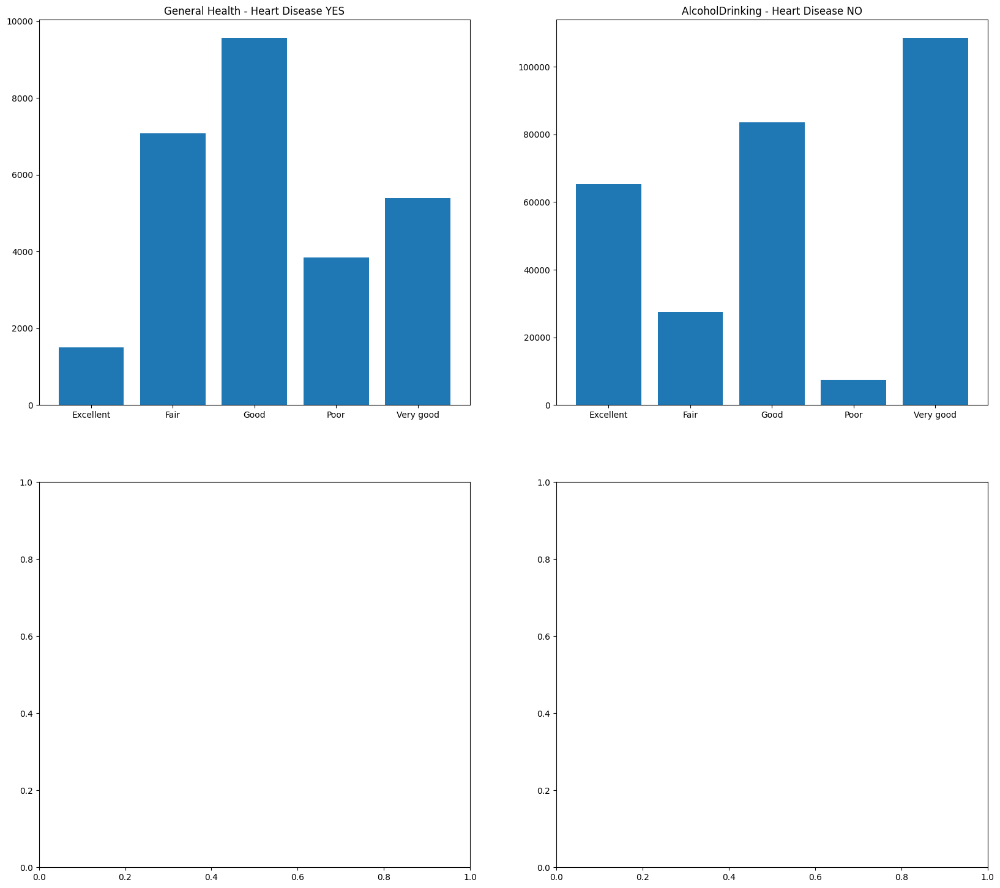

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(20, 18))
axs[0, 0].bar(df[df["HeartDisease"] == 'Yes'].groupby("GenHealth")["HeartDisease"].count().index, df[df["HeartDisease"] == 'Yes'].groupby("GenHealth")["HeartDisease"].count().values)
axs[0, 0].set_title('General Health - Heart Disease YES')
axs[0, 1].bar(df[df["HeartDisease"] == 'No'].groupby("GenHealth")["HeartDisease"].count().index, df[df["HeartDisease"] == 'No'].groupby("GenHealth")["HeartDisease"].count().values)
axs[0, 1].set_title('AlcoholDrinking - Heart Disease NO')

The most apparent relationships with Heart Disease are Poor and Excellent overall health

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

<Axes: xlabel='State'>

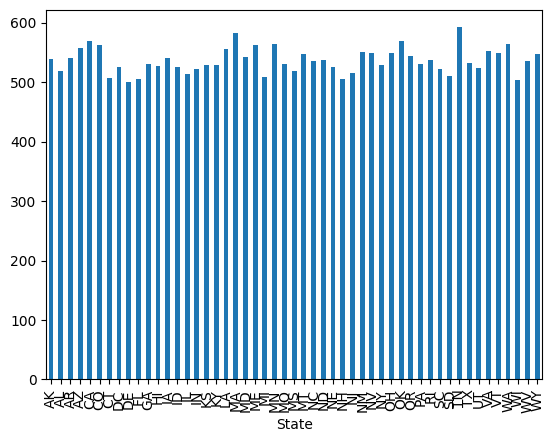

In [ ]:
state_hd = df[df['HeartDisease'] == 'Yes'].groupby('State')['HeartDisease'].count()
state_hd.plot.bar(state_hd.index)

The above hideous plot does not show enough reason for me to drop the State from the dataframe. It does seem that there is certain variance between states that I cannot simply ignore

For example 600 people in Tennessee vs. 500 people in Delaware, is a 20% difference.

### Further exploring

    Variability of answers

In [ ]:
df.apply(lambda x: x.nunique(), axis=0)

HeartDisease           2
BMI                 3609
Smoking                2
AlcoholDrinking        3
Stroke                 3
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           14
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             24
Asthma                 2
KidneyDisease          2
SkinCancer             3
State                 51
dtype: int64

In [ ]:
dfloat = df.select_dtypes(include = 'float')

In [ ]:
dfloat.corr()

,BMI,PhysicalHealth,MentalHealth,SleepTime
BMI,1.00,0.11,0.06,-0.05
PhysicalHealth,0.11,1.00,0.29,-0.06
MentalHealth,0.06,0.29,1.00,-0.12
SleepTime,-0.05,-0.06,-0.12,1.00


In [ ]:
bmi_yes = df.loc[df['HeartDisease'] == 'Yes', 'BMI']
bmi_no = df.loc[df['HeartDisease'] == 'No', 'BMI']
phy_yes = df.loc[df['HeartDisease'] == 'Yes', 'PhysicalHealth']
phy_no = df.loc[df['HeartDisease'] == 'No', 'PhysicalHealth']
men_yes = df.loc[df['HeartDisease'] == 'Yes', 'MentalHealth']
men_no = df.loc[df['HeartDisease'] == 'No', 'MentalHealth']
sleep_yes = df.loc[df['HeartDisease'] == 'Yes', 'SleepTime']
sleep_no = df.loc[df['HeartDisease'] == 'No', 'SleepTime']

Text(0.5, 1.0, 'Sleep and HD')

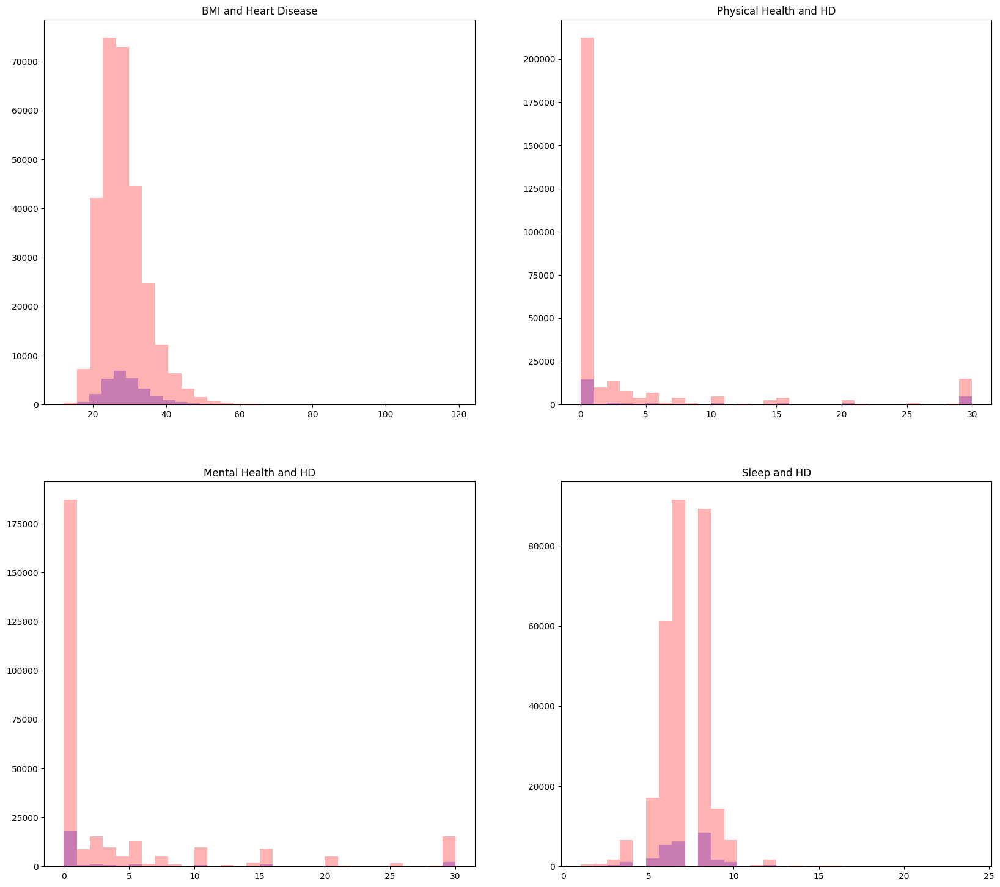

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(20, 18))
axs[0, 0].hist(df.loc[df['HeartDisease'] == 'Yes', 'BMI'], bins=30, color = 'blue', alpha = 0.3)
axs[0, 0].hist(df.loc[df['HeartDisease'] == 'No', 'BMI'], bins=30, color = 'red', alpha = 0.3)
axs[0, 0].set_title('BMI and Heart Disease')

axs[0, 1].hist(phy_yes, bins = 30, color = 'blue', alpha = 0.3)
axs[0, 1].hist(phy_no, bins = 30, color = 'red', alpha = 0.3)
axs[0, 1].set_title('Physical Health and HD')

axs[1, 0].hist(men_yes, bins = 30, color = 'blue', alpha = 0.3)
axs[1, 0].hist(men_no, bins = 30, color = 'red', alpha = 0.3)
axs[1, 0].set_title('Mental Health and HD')

axs[1, 1].hist(sleep_yes, bins = 30, color = 'blue', alpha = 0.3)
axs[1, 1].hist(sleep_no, bins = 30, color = 'red', alpha = 0.3)
axs[1, 1].set_title('Sleep and HD')

I've discussed this previously, but given the distribution of the cases in BMI it does not seem to be that this variable explains heart disease (which is counterintuitive).

Physical and Mental health are a strange case. They would not form a normal distribution because they express count of time data, so there is no need of transforming them.

Sleep alo seems to distribute around seven hours

All these histograms just further show me how "fake" this data is :)

In [ ]:
np.unique(df.AgeCategory, return_counts = True)[0]

array(['0', '18-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54',
       '55-59', '60-64', '65-69', '70-74', '75-79', '80 or older'],
      dtype=object)

In [ ]:
px.histogram?

Signature:
px.histogram(
    data_frame=None,
    x=None,
    y=None,
    color=None,
    pattern_shape=None,
    facet_row=None,
    facet_col=None,
    facet_col_wrap=0,
    facet_row_spacing=None,
    facet_col_spacing=None,
    hover_name=None,
    hover_data=None,
    animation_frame=None,
    animation_group=None,
    category_orders=None,
    labels=None,
    color_discrete_sequence=None,
    color_discrete_map=None,
    pattern_shape_sequence=None,
    pattern_shape_map=None,
    marginal=None,
    opacity=None,
    orientation=None,
    barmode='relative',
    barnorm=None,
    histnorm=None,
    log_x=False,
    log_y=False,
    range_x=None,
    range_y=None,
    histfunc=None,
    cumulative=None,
    nbins=None,
    text_auto=False,
    title=None,
    template=None,
    width=None,
    height=None,
) -> plotly.graph_objs._figure.Figure
Docstring:
    In a histogram, rows of `data_frame` are grouped together into a
    rectangular mark to visualize the 1D distribution of a

In [ ]:
px.histogram(df[df['HeartDisease'] =='Yes'].AgeCategory, x = np.unique(df[df['HeartDisease'] =='Yes'].AgeCategory, return_counts = True)[0], y = np.unique(df[df['HeartDisease'] =='Yes'].AgeCategory, return_counts = True)[1], title ='Age distribution of those with Heart Disease') #color = np.unique(df.AgeCategory, return_counts = True)[0])


In [ ]:
px.histogram(df[df['HeartDisease'] =='No'].AgeCategory, x = np.unique(df[df['HeartDisease'] =='No'].AgeCategory, return_counts = True)[0], y = np.unique(df[df['HeartDisease'] =='No'].AgeCategory, return_counts = True)[1], title ='Age distribution of those without Heart Disease')

Here we see another strong metric that might help us predict the probability of having Heart Disease

# Transforming Data

In [ ]:
t_df = df.copy() #In case I mess up my transformations, I will use this backup

In [ ]:
t_df.describe().T

,count,mean,std,min,25%,50%,75%,max
BMI,"319,795.00",28.33,6.37,12.02,24.03,27.34,31.44,119.00
PhysicalHealth,"319,795.00",3.37,7.95,0.00,0.00,0.00,2.00,30.00
MentalHealth,"319,795.00",3.90,7.96,0.00,0.00,0.00,3.00,30.00
SleepTime,"319,795.00",7.10,1.44,1.00,6.00,7.00,8.00,24.00


In [ ]:
t_df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
HeartDisease,319795,2,No,292422
Smoking,319795,2,No,187887
AlcoholDrinking,319795,3,No,191207
Stroke,319795,3,No,306614
DiffWalking,319795,2,No,275385
Sex,319795,2,Female,167805
AgeCategory,319795,14,65-69,34143
Race,319795,6,White,245212
Diabetic,319795,4,No,269653
PhysicalActivity,319795,2,Yes,247957


I will transform Age Category using the one-hot encoding transformation, based on the amount of unique data being higher than the rest. It is not a very large amount. only 14 categories will add few extra columns to the dataframe

In [ ]:
_dummy_dataset = pd.get_dummies(t_df['AgeCategory'], prefix='AgeCat')

In [ ]:
_dummy_dataset = _dummy_dataset*1

In [ ]:
t_df = pd.concat([t_df,_dummy_dataset],axis = 1)

In [ ]:
t_df.drop(['AgeCategory'], axis = 1, inplace = True)

Similarly it will be done with Race, Diabetes and GeneralHealth

In [ ]:
t_df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
HeartDisease,319795,2,No,292422
Smoking,319795,2,No,187887
AlcoholDrinking,319795,3,No,191207
Stroke,319795,3,No,306614
DiffWalking,319795,2,No,275385
Sex,319795,2,Female,167805
Race,319795,6,White,245212
Diabetic,319795,4,No,269653
PhysicalActivity,319795,2,Yes,247957
GenHealth,319795,5,Very good,113858


In [ ]:
race_dummy = pd.get_dummies(t_df['Race'], prefix = "Race")
race_dummy = race_dummy*1
t_df = pd.concat([t_df,race_dummy], axis = 1)
t_df.drop(['Race'], axis = 1, inplace = True)

In [ ]:
diabetic_dummy = pd.get_dummies(t_df['Diabetic'], prefix = "diabetic")
diabetic_dummy = diabetic_dummy*1
t_df = pd.concat([t_df,diabetic_dummy], axis = 1)
t_df.drop(['Diabetic'], axis = 1, inplace = True)

In [ ]:
genhe_dummy = pd.get_dummies(t_df['GenHealth'], prefix = "Health")
genhe_dummy = genhe_dummy*1
t_df = pd.concat([t_df,genhe_dummy], axis = 1)
t_df.drop(['GenHealth'], axis = 1, inplace = True)


Gender is tricky, becuase I don't ant to simply add 1 to Men and 0 to Female based on numbers of known Heath Disease proportions. That is a very small bias that might skew our results.

So I considered doing a frequency encoder, however the frequencies were so different that it might just bias my model even more towards males.

it might sound weird but I will do another one hot-encoding for this variable as well

In [ ]:
sex_dummy = pd.get_dummies(t_df['Sex'], prefix = "Sex")
sex_dummy = sex_dummy*1
t_df = pd.concat([t_df,sex_dummy], axis = 1)
t_df.drop(['Sex'], axis = 1, inplace = True)

Given that the counts of people with heart disease in State was relatively homogenous (between 400 and 600), I will use a frequency encoder for this variable

In [ ]:
state_df = pd.DataFrame(t_df['State'].value_counts())
state_df.T

State,OH,VA,MS,CA,AZ,ME,MN,OR,TX,TN,...,MD,MO,UT,GA,SD,HI,KS,CT,WY,IL
count,6429,6415,6396,6380,6378,6375,6366,6365,6355,6354,...,6202,6197,6187,6175,6169,6167,6165,6151,6136,6105


In [ ]:
state_df.index

Index(['OH', 'VA', 'MS', 'CA', 'AZ', 'ME', 'MN', 'OR', 'TX', 'TN', 'MI', 'ID',
       'IA', 'NE', 'FL', 'WA', 'AK', 'SC', 'AR', 'OK', 'NM', 'DC', 'MA', 'NH',
       'NC', 'CO', 'VT', 'NJ', 'ND', 'RI', 'IN', 'MT', 'AL', 'LA', 'KY', 'WV',
       'NY', 'WI', 'PA', 'DE', 'NV', 'MD', 'MO', 'UT', 'GA', 'SD', 'HI', 'KS',
       'CT', 'WY', 'IL'],
      dtype='object', name='State')

In [ ]:
state_df.columns = ['State_count']
#state_df['State'] = state_df.index


In [ ]:
state_df.T

State,OH,VA,MS,CA,AZ,ME,MN,OR,TX,TN,...,MD,MO,UT,GA,SD,HI,KS,CT,WY,IL
State_count,6429,6415,6396,6380,6378,6375,6366,6365,6355,6354,...,6202,6197,6187,6175,6169,6167,6165,6151,6136,6105


In [ ]:
state_df.shape

(51, 1)

In [ ]:
t_df = t_df.merge(state_df, on = 'State')

I want to add that this method of merging dataframes based on a variable is amazing

In [ ]:
t_df.drop('State', axis = 1, inplace = True)

Now I will apply Label encoding to my boolean-like data, since 1s and 0s will help greatly in my decision tree, and also will work really nicely with my transformed State data

In [ ]:
t_df = t_df.replace({'Yes': 1, 'No': 0, "NoData":0.5})

In [ ]:
t_df.columns

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'PhysicalActivity',
       'SleepTime', 'Asthma', 'KidneyDisease', 'SkinCancer', 'AgeCat_0',
       'AgeCat_18-24', 'AgeCat_25-29', 'AgeCat_30-34', 'AgeCat_35-39',
       'AgeCat_40-44', 'AgeCat_45-49', 'AgeCat_50-54', 'AgeCat_55-59',
       'AgeCat_60-64', 'AgeCat_65-69', 'AgeCat_70-74', 'AgeCat_75-79',
       'AgeCat_80 or older', 'Race_American Indian/Alaskan Native',
       'Race_Asian', 'Race_Black', 'Race_Hispanic', 'Race_Other', 'Race_White',
       'diabetic_No', 'diabetic_No, borderline diabetes', 'diabetic_Yes',
       'diabetic_Yes (during pregnancy)', 'Health_Excellent', 'Health_Fair',
       'Health_Good', 'Health_Poor', 'Health_Very good', 'Sex_Female',
       'Sex_Male', 'State_count'],
      dtype='object')

In [ ]:
t_df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,PhysicalActivity,SleepTime,...,diabetic_Yes,diabetic_Yes (during pregnancy),Health_Excellent,Health_Fair,Health_Good,Health_Poor,Health_Very good,Sex_Female,Sex_Male,State_count
0,0,16.60,1,0.00,0.00,3.00,30.00,0,1,5.00,...,1,0,0,0,0,0,1,1,0,6234
1,0,26.45,0,0.00,0.00,0.00,0.00,0,0,5.00,...,0,0,0,1,0,0,0,1,0,6234
2,0,58.54,0,0.50,0.00,30.00,0.00,1,1,3.00,...,0,0,0,0,0,1,0,0,1,6234
3,0,22.60,1,0.00,0.00,0.00,0.00,0,1,8.00,...,0,0,0,0,0,0,1,1,0,6234
4,1,27.29,1,0.00,1.00,30.00,16.00,1,0,6.00,...,0,0,0,0,0,1,0,1,0,6234
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,0,35.44,1,0.00,0.00,10.00,20.00,1,0,9.00,...,1,0,0,1,0,0,0,0,1,6247
319791,0,37.11,0,0.00,0.00,0.00,0.00,0,0,7.00,...,1,0,0,0,1,0,0,1,0,6247
319792,0,24.56,1,0.00,0.00,0.00,0.00,0,0,7.00,...,0,0,0,1,0,0,0,1,0,6247
319793,1,35.44,0,0.00,0.00,6.00,0.00,0,1,6.00,...,0,0,0,0,1,0,0,0,1,6247


Now I realized that.... Sex counts might actually bias even more my results, now that I see that the differences are some much greater. I will transform Sex_count into 1 and 0

I considered transforming the state counts because they were veyr big numbers, however let's try first the model and then consider those transformations

In [ ]:
from sklearn import model_selection # model assesment and model selection strategies
from sklearn import metrics # model evaluation metrics

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

Now we need to train the model and split the data

In [ ]:
t_df.shape

(319795, 45)

My training data will be half of the dataframe and my validation data will be the other half

Since I am not sure if the data is organized in a certain way, I will generate two dataframes based on random sub-samplings of the original dataframe.
My Development data should be all cases that have heart attack + a large amount of patients that do not suffer from heart disease. The validation data will be 1/4 of the data left, which is full of patients that do not have any reported case of heart disease, and we will predict who will have.

In [ ]:
t_df.shape[0]/4

79948.75

Above is the number of rows I want to keep as my validation data (Heart Disease = No rows only)

In [ ]:
print(t_df[t_df['HeartDisease'] == 1].shape)
print(t_df[t_df['HeartDisease'] == 0].shape)

(27373, 45)
(292422, 45)


In [ ]:
#dev_df = pd.concat([dev_df, t_df[t_df['HeartDisease'] == 1]], ignore_index = True)

In [ ]:
#val_df = t_df.drop(dev_df.index)


In [ ]:
#dev_df = dev_df.reset_index(drop=True)
#val_df = val_df.reset_index(drop=True)

Above, commented (in green) is a previous attempt I tried, erroneously leaving my dev_df free from heart disease.

In [ ]:
dev_df = t_df.sample(frac=0.75, random_state=42)

val_df = t_df.drop(dev_df.index)

dev_df = dev_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [ ]:
print("Development df's length:",len(dev_df))
print("Validation df's length:", len(val_df))

Development df's length: 239846
Validation df's length: 79949


In [ ]:
dev_df_X = dev_df.drop('HeartDisease',axis = 1)
dev_df_y = dev_df[['HeartDisease']]

In [ ]:
val_df_X = val_df.drop('HeartDisease',axis = 1)
val_df_y = val_df[['HeartDisease']]

In [ ]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
                                        dev_df_X, # X
                                        dev_df_y, # y
                                        test_size = 0.30,
                                        random_state = 42
                                     )

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

In [ ]:
dt = DecisionTreeClassifier(
                        # criterion='gini',
                        # splitter='best',
                        max_depth=6, # Importante, regulará el sobreajuste
                        # min_samples_split=2, #minimum number of observations in each split
                        # min_samples_leaf=1, # minimum number of observations in each leaf
                        # min_weight_fraction_leaf=0.0,
                        # max_features=None,
                        random_state=42,
                        # max_leaf_nodes=None,
                        # min_impurity_decrease=0.0,
                        # min_impurity_split=None,
                        # class_weight=None,
                        # presort=False,
                )

At this point I am violently copying ang pasting, obviously trying to understand using the documentation. I increased the max_depth to 6 because I am dealing with multifactorial data here. Previous analyses of the data showed me that there is no specific link or MAIN explainatory variable and I suspect there will be a large combination of variables

In [ ]:
dt.fit(
    X=X_train,
    y=y_train)

DecisionTreeClassifier(max_depth=6, random_state=42)

In [ ]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,State
0,No,16.60,Yes,No,No,3.00,30.00,No,Female,55-59,White,Yes,Yes,Very good,5.00,Yes,No,Yes,MT
1,No,20.34,No,NoData,Yes,0.00,0.00,No,Female,80 or older,White,No,Yes,Very good,7.00,No,No,No,VT
2,No,26.58,Yes,NoData,No,20.00,30.00,No,Male,65-69,White,Yes,Yes,Fair,8.00,Yes,No,No,WY
3,No,24.21,No,NoData,No,0.00,0.00,No,Female,75-79,White,No,No,Good,6.00,No,No,Yes,VT
4,No,23.71,No,No,No,28.00,0.00,Yes,Female,40-44,White,No,Yes,Very good,8.00,No,No,No,DC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.41,Yes,No,No,7.00,0.00,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.00,Yes,No,No,AZ
319791,No,29.84,Yes,NoData,No,0.00,0.00,No,Male,35-39,Hispanic,No,Yes,Very good,5.00,Yes,No,No,NH
319792,No,24.24,No,No,No,0.00,0.00,No,Female,45-49,Hispanic,No,Yes,Good,6.00,No,No,No,DE
319793,No,32.81,No,NoData,No,0.00,0.00,No,Female,25-29,Hispanic,No,No,Good,12.00,No,No,No,UT


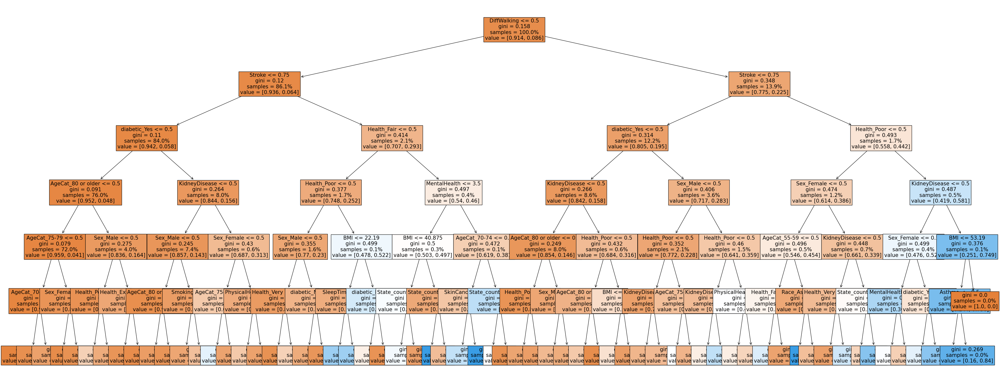

In [ ]:
fig, ax = plt.subplots(figsize=(50,20))
tree.plot_tree(dt,
               ax = ax,
               fontsize = 15,
               proportion=True,
               filled = True,
               feature_names = X_test.columns);


Text(0.5, 0, 'Random Forest Feature Importance')

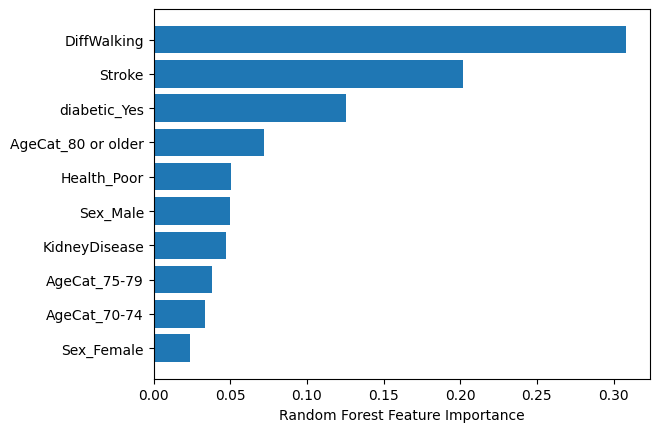

In [ ]:
sorted_idx = dt.feature_importances_.argsort()
plt.barh(X_train.columns[sorted_idx][-10:], dt.feature_importances_[sorted_idx][-10:])
plt.xlabel("Random Forest Feature Importance")


In [ ]:
stroke = heart_disease.Stroke.replace({'Yes':1,'No':0}).value_counts()

In [ ]:
stroke

Stroke
0.00    22906
1.00     4389
Name: count, dtype: int64

According to the model, having had a strokeis the metric with the most weight in having Heart Disease. It is 30% important however, which indicates me that having Heart Disease is a multifactorial, synergistc affliction, rather than having one variable that explains all

In [ ]:
print('We observe also in the mini dataframe under the random forest, that ', 100*stroke[1]/(stroke[1]+stroke[0]),
 '% of the people that had walking difficulty suffer from heart disease')

We observe also in the mini dataframe under the random forest, that  16.079868107712034 % of the people that had walking difficulty suffer from heart disease


Having just analyzed Stroke independently might have contributed into wrong conclusions to be drawn. This is also truth for being diabetic or having difficulty in wealikg, especially because there are a lot of people with difficulty walking that did no had heart disease.

We do see that Difficulty Walking is a metric that acts in conjoint with other variables

Being diabetic is a codnition that also contributes to being at risk of having Heart Disease.

Overall, old age is also something that increases your chance of having heartr fialure

The above mini DF is important because it shows at first

### Evaluation of the model

In [ ]:
y_train_pred = pd.DataFrame(dt.predict(X_train), index=y_train.index, columns=['DelayPrediction'])

In [ ]:
y_train_pred.head()

,DelayPrediction
227539,0
148686,0
212824,0
12951,0
170170,0


In [ ]:
y_train.head()

,HeartDisease
227539,0
148686,0
212824,0
12951,0
170170,0


In [ ]:
results_df = y_train.join(y_train_pred, how= 'inner')

In [ ]:
results_df['Success'] = (results_df['HeartDisease'] == results_df['DelayPrediction']).astype(int)

In [ ]:
results_df.head(20)

,HeartDisease,DelayPrediction,Success
227539,0,0,1
148686,0,0,1
212824,0,0,1
12951,0,0,1
170170,0,0,1
29977,0,0,1
180126,0,0,1
154875,0,0,1
128842,1,1,1
41601,1,0,0


In [ ]:
results_df['Success'].count()

167892

In [ ]:
results_df['Success'].sum()

153740

In [ ]:
results_df['Success'].mean()

0.915707716865604

In [ ]:
confusion_matrix = pd.crosstab(results_df['HeartDisease'], results_df['DelayPrediction'])


In [ ]:
confusion_matrix

DelayPrediction,0,1
HeartDisease,,
0,152634,778
1,13374,1106


In [ ]:
TP = confusion_matrix.iloc[1,1]
TN = confusion_matrix.iloc[0,0]
FP = confusion_matrix.iloc[0,1]
FN = confusion_matrix.iloc[1,0]

In [ ]:
accuracy = (TP + TN) / (TP + TN + FP + FN)

accuracy

0.915707716865604

In [ ]:
Precision = TP / (TP+FP)
Recall = TP/(TP+FN)
print(Precision)
print(Recall)

0.5870488322717622
0.07638121546961325


In total I am predicting 60% of the HeartDiseases with my model.
And my recall is absolutely abysmal

In [ ]:
confusion_matrix_m = metrics.confusion_matrix(results_df['HeartDisease'],results_df['DelayPrediction'])
tn, fp, fn, tp = confusion_matrix_m.ravel()
Accuracy_m = metrics.accuracy_score(results_df['HeartDisease'], results_df['DelayPrediction'])
Precision_m = metrics.precision_score(results_df['HeartDisease'],results_df['DelayPrediction'])
Recall_m = metrics.recall_score(results_df['HeartDisease'],results_df['DelayPrediction'])

print("Confusion matrix: ", confusion_matrix_m)
print(f"TN = {tn} - FP = {fp} - FN = {fn} - TP = {tp}")

print("Accuracy: ", Accuracy_m)
print("Precision: ", Precision_m)
print("Recall: ", Recall_m)


Confusion matrix:  [[152634    778]
 [ 13374   1106]]
TN = 152634 - FP = 778 - FN = 13374 - TP = 1106
Accuracy:  0.915707716865604
Precision:  0.5870488322717622
Recall:  0.07638121546961325


In [ ]:
dt.score(X_test, y_test)

0.9166411874252995

It seems that my model after all was not that bad. To really understand how bad or good it is, I have to use it to predict with the other half of my dataset

In [ ]:
y_test_pred = pd.DataFrame(dt.predict(X_test), index=y_test.index, columns=['DelayPrediction'])

In [ ]:
results_df_test = y_test.join(y_test_pred, how= 'inner')
results_df_test['Success'] = (results_df_test['HeartDisease'] == results_df_test['DelayPrediction']).astype(int)

In [ ]:
confusion_matrix_m_test = metrics.confusion_matrix(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])
tn, fp, fn, tp = confusion_matrix_m_test.ravel()
Accuracy_m_test = metrics.accuracy_score(results_df_test['HeartDisease'], results_df_test['DelayPrediction'])
Precision_m_test = metrics.precision_score(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])
Recall_m_test = metrics.recall_score(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])

print("Confusion matrix: ", confusion_matrix_m_test)
print(f"TN = {tn} - FP = {fp} - FN = {fn} - TP = {tp}")
print("Accuracy: ", Accuracy_m_test)
print("Precision: ", Precision_m_test)
print("Recall: ", Recall_m_test)


Confusion matrix:  [[65566   396]
 [ 5602   390]]
TN = 65566 - FP = 396 - FN = 5602 - TP = 390
Accuracy:  0.9166411874252995
Precision:  0.4961832061068702
Recall:  0.065086782376502


In [ ]:
y_score = pd.DataFrame(dt.predict_proba(X_test)[:,1], index=y_test.index, columns=['HeartDiseaseScore'])

In [ ]:
results_df_test = results_df_test.join(y_score)

In [ ]:
results_df_test.head(10)

,HeartDisease,DelayPrediction,Success,HeartDiseaseScore
186371,0,0,1,0.03
208508,1,0,0,0.25
129903,0,0,1,0.03
190597,0,0,1,0.03
45726,0,0,1,0.11
176047,0,0,1,0.03
164777,0,0,1,0.03
138444,0,0,1,0.03
5393,1,0,0,0.03
101537,0,0,1,0.03


In [ ]:
results_df_test.info()


<class 'pandas.core.frame.DataFrame'>
Index: 71954 entries, 186371 to 131096
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   HeartDisease       71954 non-null  int64  
 1   DelayPrediction    71954 non-null  int64  
 2   Success            71954 non-null  int32  
 3   HeartDiseaseScore  71954 non-null  float64
dtypes: float64(1), int32(1), int64(2)
memory usage: 4.5 MB


### Performance

In [ ]:
for i in range(1, 20):
    dt = DecisionTreeClassifier(max_depth=i, random_state=42)
    dt.fit(X_train, y_train)
    train_accuracy = dt.score(X_train, y_train)
    test_accuracy = dt.score(X_test, y_test)
    print('Tree max_depth: {}. Train: {} - Test: {}'.format(i, train_accuracy, test_accuracy))

Tree max_depth: 1. Train: 0.913754080003812 - Test: 0.9167245740334102
Tree max_depth: 2. Train: 0.913754080003812 - Test: 0.9167245740334102
Tree max_depth: 3. Train: 0.9145402997164844 - Test: 0.9170303249298163
Tree max_depth: 4. Train: 0.9145939056059847 - Test: 0.9172665869861301
Tree max_depth: 5. Train: 0.9150167965120435 - Test: 0.916502209745115
Tree max_depth: 6. Train: 0.915707716865604 - Test: 0.9166411874252995
Tree max_depth: 7. Train: 0.9165296738379435 - Test: 0.9168913472496317
Tree max_depth: 8. Train: 0.9176613537273962 - Test: 0.916168663312672
Tree max_depth: 9. Train: 0.9192457055726301 - Test: 0.915223615087417
Tree max_depth: 10. Train: 0.9214316346222572 - Test: 0.9141534869499959
Tree max_depth: 11. Train: 0.9241536225668883 - Test: 0.9129443811323902
Tree max_depth: 12. Train: 0.9276201367545803 - Test: 0.9119159462990244
Tree max_depth: 13. Train: 0.9315988849974984 - Test: 0.9094421435917391
Tree max_depth: 14. Train: 0.9362864222238105 - Test: 0.9074547627

In [ ]:
for i in range(1, 20):
    dt = DecisionTreeClassifier(max_depth=i, random_state=42, min_samples_split=40)
    dt.fit(X_train, y_train)
    train_accuracy = dt.score(X_train, y_train)
    test_accuracy = dt.score(X_test, y_test)
    print('Max depth: {}. Train: {} - Test: {}'.format(i, train_accuracy, test_accuracy))

Max depth: 1. Train: 0.913754080003812 - Test: 0.9167245740334102
Max depth: 2. Train: 0.913754080003812 - Test: 0.9167245740334102
Max depth: 3. Train: 0.9145402997164844 - Test: 0.9170303249298163
Max depth: 4. Train: 0.9145939056059847 - Test: 0.9172665869861301
Max depth: 5. Train: 0.9150167965120435 - Test: 0.916502209745115
Max depth: 6. Train: 0.9156898482357706 - Test: 0.9165161075131334
Max depth: 7. Train: 0.9164165058489981 - Test: 0.9168357561775579
Max depth: 8. Train: 0.9173754556500607 - Test: 0.9160296856324874
Max depth: 9. Train: 0.9183820551306793 - Test: 0.9150568418711955
Max depth: 10. Train: 0.9194482167107426 - Test: 0.9139867137337744
Max depth: 11. Train: 0.9206454149095847 - Test: 0.912972176668427
Max depth: 12. Train: 0.9217056202797036 - Test: 0.9118047641548768
Max depth: 13. Train: 0.922795606699545 - Test: 0.9102621119048281
Max depth: 14. Train: 0.9238141186000525 - Test: 0.909191983767407
Max depth: 15. Train: 0.92454077621328 - Test: 0.90881674403090

In [ ]:
dt = DecisionTreeClassifier(max_depth=11, min_samples_split=50)
dt.fit(X_train, y_train)


#Again, I dropped the random_state because my variable was previously randomized

DecisionTreeClassifier(max_depth=11, min_samples_split=50)

In [ ]:
dt.score(X_train, y_train)

0.920049793915136

In [ ]:
dt.score(X_test, y_test)

0.9132084387247408

In [ ]:
dt.score(val_df_X, val_df_y)

0.9119438642134361

In [ ]:
y_test_pred = pd.DataFrame({'DelayPrediction' : dt.predict(X_test),
                            'HeartDiseaseScore': dt.predict_proba(X_test)[:,1]},
                            index=y_test.index)
results_df_test = y_test.join(y_test_pred, how= 'inner')
results_df_test['Success'] = (results_df_test['HeartDisease'] == results_df_test['DelayPrediction']).astype(int)

In [ ]:
confusion_matrix_m_test = metrics.confusion_matrix(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])
tn, fp, fn, tp = confusion_matrix_m_test.ravel()
Accuracy_m_test = metrics.accuracy_score(results_df_test['HeartDisease'], results_df_test['DelayPrediction'])
Precision_m_test = metrics.precision_score(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])
Recall_m_test = metrics.recall_score(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])
f1_m_test = metrics.f1_score(results_df_test['HeartDisease'],results_df_test['DelayPrediction'])

print("Confusion matrix: ", confusion_matrix_m_test)
print(f"TN = {tn} - FP = {fp} - FN = {fn} - TP = {tp}")
print("Accuracy: ", Accuracy_m_test)
print("Precision: ", Precision_m_test)
print("Recall: ", Recall_m_test)
print("F1 Score: ", f1_m_test)


Confusion matrix:  [[65100   862]
 [ 5383   609]]
TN = 65100 - FP = 862 - FN = 5383 - TP = 609
Accuracy:  0.9132084387247408
Precision:  0.4140040788579198
Recall:  0.10163551401869159
F1 Score:  0.16320514538389388


In [ ]:
print(metrics.roc_auc_score(results_df_test['HeartDisease'],results_df_test['HeartDiseaseScore']))

0.8120266940013892


In [ ]:
fpr, tpr, _ = metrics.roc_curve(results_df_test['HeartDisease'], results_df_test['HeartDiseaseScore'])

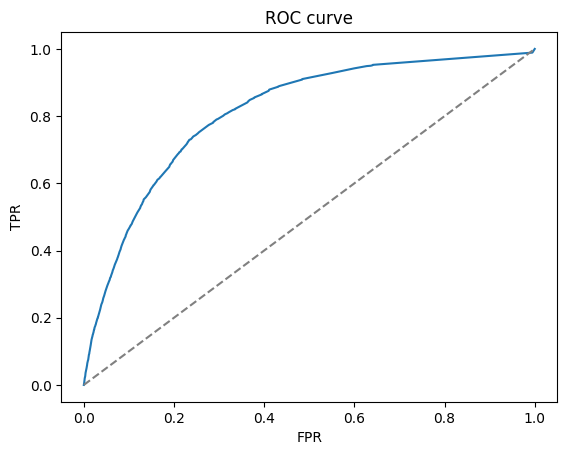

In [ ]:
plt.clf()
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [ ]:
kf = model_selection.KFold(n_splits=10, shuffle=False)

In [ ]:
dt = DecisionTreeClassifier(max_depth=8, random_state=42)
scores = model_selection.cross_val_score(dt, dev_df_X, dev_df_y, cv=kf)

In [ ]:
scores

array([0.91828226, 0.91932458, 0.91498853, 0.91411299, 0.91140296,
       0.91582239, 0.91227485, 0.91456805, 0.91385924, 0.91331721])

In [ ]:
print("Accuracy: %0.3f (+/- %0.3f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.915 (+/- 0.005)


In [ ]:
scores_list = []
for train_index, test_index in kf.split(dev_df):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = dev_df_X.iloc[train_index], dev_df_X.iloc[test_index]
    y_train, y_test = dev_df_y.iloc[train_index], dev_df_y.iloc[test_index]
    dt = DecisionTreeClassifier(max_depth=8, random_state=42)
    dt.fit(X_train, y_train)
    _score = dt.score(X_test, y_test)
    scores_list.append(_score)
    #print(_scores)
scores_list

[0.9182822597456743,
 0.9193245778611632,
 0.9149885345007296,
 0.914112987283719,
 0.911402960183448,
 0.9158223889931207,
 0.9122748498999332,
 0.9145680453635757,
 0.9138592394929953,
 0.9133172114743162]

### Random Foresting the model

In [ ]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [ ]:
rf = RandomForestClassifier(n_estimators=6, max_depth=6)

In [ ]:
rf.fit(
    X=X_train,
    y=np.ravel(y_train)
)

RandomForestClassifier(max_depth=6, n_estimators=6)

In [ ]:
tree_list = rf.estimators_

In [ ]:
tree_list

[DecisionTreeClassifier(max_depth=6, max_features='sqrt',
                        random_state=1705697418),
 DecisionTreeClassifier(max_depth=6, max_features='sqrt',
                        random_state=1433900438),
 DecisionTreeClassifier(max_depth=6, max_features='sqrt', random_state=71902760),
 DecisionTreeClassifier(max_depth=6, max_features='sqrt',
                        random_state=1399137619),
 DecisionTreeClassifier(max_depth=6, max_features='sqrt', random_state=465209555),
 DecisionTreeClassifier(max_depth=6, max_features='sqrt', random_state=77109102)]

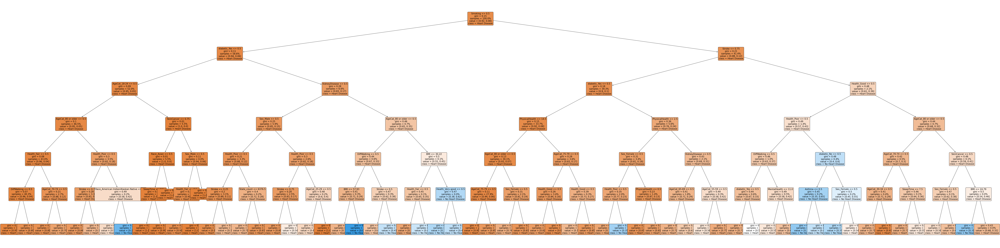

In [ ]:
fig, ax = plt.subplots(figsize=(120,30))
tree.plot_tree(tree_list[0],
               ax = ax,
               fontsize = 15,
               proportion=True,
               filled = True,
               impurity=True,
                rounded = True,
               precision = 2,

               class_names = ['Heart Disease', 'No Heart Disease'],
               feature_names = X_test.columns);

In [ ]:
val_df[val_df['HeartDisease']== 1].shape

(6901, 45)

Pedro, I have run this model at least 6 times playing with the def_df and val_df proportions. 50-50%, 75-25%, random sample number, even one crazy attempt of having my validation data being without any target.

I have had three dissimilar decision trees, one that says that Stroke is the Root, and other that says DiffWalking is the Root, a third one in which being Diabetic is the Root, one that NOT BEING DIABETIC is the Root.

I honestly have no idea how to sample my dev_df and val_df correctly, for my original df is not organized in any way.

In [ ]:
top_features = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False).head(20)

In [ ]:
top_features

Stroke               0.19
diabetic_Yes         0.10
PhysicalHealth       0.10
Health_Poor          0.06
Health_Very good     0.06
KidneyDisease        0.06
diabetic_No          0.06
Health_Excellent     0.05
Smoking              0.05
AgeCat_80 or older   0.05
Health_Good          0.04
DiffWalking          0.03
AgeCat_75-79         0.03
Health_Fair          0.03
Sex_Female           0.02
AgeCat_70-74         0.02
Sex_Male             0.01
AgeCat_18-24         0.01
BMI                  0.01
AgeCat_40-44         0.00
dtype: float64

<Axes: >

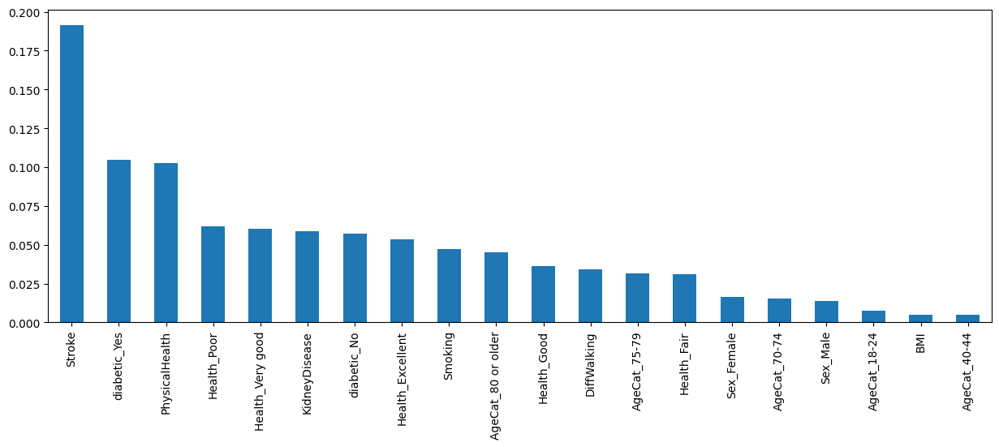

In [ ]:
plt.figure(figsize=(15,5))
top_features.plot(kind='bar')

 I re-ran the whole notebook again, and I saw how the root node of my decision tree changed from Stroke, to Physical Health and Age Category FROM 18 TO 24! and I don't know why it is doing that.
 Now, in the sixth and final iteration of the model, my decision tree says the top feature is NOT being diabetic.

 I assume the problem is how I divided the dev_df and val_dev.

My conclusion is that having Heart Disease is a multifactorial, synergistic affliction that cannot be explained by one variable alone, rather with several conditions and vices (like sedentarismn, smoking, and likely alcohol - however the latter was dropped from this case study)

With that being said, I observed on multiple iteration of the model that having had a stroke affects the heart in much more ways than any other of the metric here used. We must approach this conclusion with caution because having had a stroke likely depends on other afflictions (such as diabetes), vices (like smoking and sedentarism) and it becomes more likely in advanced age categories.

My interpretation of this decision tree is that 92% of the people that had a stroke are likely to have Heart Disease.

If you had a stroke, but do not have difficulty walking, however are sick of the kidneys, not smoke, you are between 25-29 and your general health is good, there is a chance in 20 that you will not have heart disease.

If you haven't had a stroke, and your health is mediocre (less than Very good, but better than Poor). The chances of having heart disease are 50% if you drink alcohol.




Now that I ran again the model, my decision tree changed again, and the ROOT is whether you smoke or not. How can that be true if the top feature is still stroke?

I am clearly not in the level for this assigment and I will leavi it like this